<h1 align="center"> Image Captioning With Attention</h1>

In this notebook you will teach network to use attention during captioning images.

Here is what we need to do:
1. Take pretrained VGG19 to build feature vectors for positions of images.
2. Stack LSTM with attention on top of that.
3. Train the model, draw attention maps.

This assignment is based on Alexander Panin's captioning assignment (https://github.com/yandexdataschool/Practical_DL/blob/spring2019/homework04/homework04_basic_part2_image_captioning.ipynb) and on the paper "Show, Attend and Tell" (https://arxiv.org/abs/1502.03044).

In [ ]:
# import os
# os.environ['CUDA_VISIBLE_DEVICES'] = '0'
# https://drive.google.com/file/d/1sK1jLzW8RRAW4tnvD01ESS7Dj4eDuLuX/view

In [ ]:
import json
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import h5py

import sys

%matplotlib inline

In [ ]:
# you may need to install h5py, tqdm
!pip install h5py tqdm gdown

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# downloading preprocessed dataset
!gdown https://drive.google.com/uc?id=1sK1jLzW8RRAW4tnvD01ESS7Dj4eDuLuX

Downloading...
From: https://drive.google.com/uc?id=1sK1jLzW8RRAW4tnvD01ESS7Dj4eDuLuX
To: /content/attention.zip
100% 4.03G/4.03G [01:30<00:00, 44.8MB/s]


In [ ]:
# unzip downloaded archive
!unzip attention.zip

Archive:  attention.zip
  inflating: attention/captions.json  
  inflating: attention/captions_tokenized.json  
  inflating: attention/img_codes.hdf5  


In [ ]:
# Delete archive
!rm -r attention.zip

## Data structure

To save your time, we've already vectorized all MSCOCO17 images with a pre-trained VGG19 network from [torchvision](https://github.com/pytorch/vision/blob/master/torchvision/models/vgg.py).

The whole process takes anywhere between a day on CPU and 30min on 1x GeForce GTX 1060. If you want to play with that yourself, [you're welcome](https://drive.google.com/file/d/1NLtoLqZzeES_flgs9kmmeZD_tsCTenH1/view?usp=sharing).

Please either download data from [here](https://drive.google.com/file/d/1sK1jLzW8RRAW4tnvD01ESS7Dj4eDuLuX/view?usp=sharing) or generate it manually using the above script.

In [ ]:
f = h5py.File('./attention/img_codes.hdf5', 'r')
img_codes = f['data']

In [ ]:
captions = json.load(open('./attention/captions_tokenized.json'))

In [ ]:
print("Each image code is a 512x9x9-unit tensor [ shape: %s x %s ]" % (str(len(img_codes)), str(img_codes[0].shape)))
print(img_codes[0][:3].round(2), end='\n\n')
print("For each image there are 5 reference captions, e.g.:\n")
print('\n'.join(captions[0]))

Each image code is a 512x9x9-unit tensor [ shape: 118287 x (512, 9, 9) ]
[[[0.   0.   0.   0.   0.07 0.69 0.   0.   0.  ]
  [0.   0.24 0.   0.   0.63 1.94 1.21 0.72 0.46]
  [0.77 0.76 0.   0.   0.   0.88 1.65 2.37 1.14]
  [0.21 0.   0.   0.   2.8  3.3  2.93 6.29 3.48]
  [0.   0.   0.   0.   3.29 3.81 2.24 2.76 0.01]
  [0.   0.   0.   1.18 0.32 0.08 0.   0.   0.  ]
  [1.02 1.76 0.89 1.77 0.   0.   0.   0.   0.  ]
  [0.   1.36 0.   0.   0.   0.   0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.   0.09 0.3  0.  ]]

 [[0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
  [0.   0.   0.   0.17 0.   0.   0.   0.   0.  ]
  [0.   0.95 0.   0.   0.   0.   0.   0.   0.  ]
  [0.34 1.5  0.   0.   0.36 0.   0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.23 0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.52 0.   0.   0.  ]
  [0.   0.34 0.   0.   0.   0.   0.86 0.34 0.  ]
  [0.   0.47 0.26 0.41 0.   0.   1.08 0.38 0.  ]]

 [[1.09 3.03 2.15 0.65 0.   0.   1.06 0.2

As you can see, all captions are already tokenized and lowercased. We now want to split them and add some special tokens for start/end of caption.

In [ ]:
#split descriptions into tokens
for img_i in range(len(captions)):
    for caption_i in range(len(captions[img_i])):
        sentence = captions[img_i][caption_i] 
        captions[img_i][caption_i] = ["#START#"]+sentence.split(' ')+["#END#"]

You don't want your network to predict a million-size vector of probabilities at each step, so we're gotta make some cuts. 

We want you to __count the occurences of each word__ so that we can decide which words to keep in our vocabulary.

In [ ]:
# Build a Vocabulary
from collections import Counter
word_counts = Counter()

# Compute word frequencies for each word in captions. 
# See code above for data structure
for img_i in range(len(captions)):
    for caption_i in range(len(captions[img_i])):
        word_counts.update(captions[img_i][caption_i])

In [ ]:
vocab  = ['#UNK#', '#START#', '#END#', '#PAD#']
vocab += [k for k, v in word_counts.items() if v >= 5 if k not in vocab]
n_tokens = len(vocab)

assert 10000 <= n_tokens <= 10500

word_to_index = {w: i for i, w in enumerate(vocab)}

In [ ]:
eos_ix = word_to_index['#END#']
unk_ix = word_to_index['#UNK#']
pad_ix = word_to_index['#PAD#']

def as_matrix(sequences, max_len=None):
    """ Convert a list of tokens into a matrix with padding """
    max_len = max_len or max(map(len, sequences))
    
    matrix = np.zeros((len(sequences), max_len), dtype='int32') + pad_ix
    for i, seq in enumerate(sequences):
        row_ix = [word_to_index.get(word, unk_ix) for word in seq[:max_len]]
        matrix[i, :len(row_ix)] = row_ix
    
    return matrix

In [ ]:
#try it out on several descriptions of a random image
as_matrix(captions[1337])

array([[   1,   14,  287,  141,   14, 1130,  256,   62,   14, 1291,    2,
           3,    3,    3],
       [   1,   14,  287,   62,   14, 1130,  256,  141,   14, 1291,    2,
           3,    3,    3],
       [   1,   14,   90,  141,   14, 1291,   62,   44,    5,   14, 1287,
          13,    2,    3],
       [   1,   14, 1238, 1370,   14, 1291,   62,   14,   73,   74,   13,
           2,    3,    3],
       [   1,   14,   90,   18,   71,  342,  141,   14, 1291,   62,   14,
        1287,   13,    2]], dtype=int32)

## Building our neural network

As we mentioned earlier, we shall build an rnn "language-model" conditioned on the features from the convolutional part. 

We'll unbox the inception net later to save memory, for now just pretend that it's available.

In [ ]:
import torch, torch.nn as nn
import torch.nn.functional as F

### Attention

There are $K$ objects that you can pay attention to.
Each object is characterized by the key $k_i$ and the value $v_i$.
The attention layer proceeds queries.
For the query $q$, the layer returns a weighted sum of the values of the objects, with weights proportional to the degree of key matching the query:
$$w_i = \frac{\exp(score(q, k_i))}{\sum_{j=1}^K\exp(score(q, k_j))}$$
$$a = \sum_{i=1}^K w_i v_i$$

Here we use $score(q, k) = \frac{q^Tk}{\sqrt{dim(k)}}$, where $dim(k)$ is the dimensionality of the key (which also equals the dimensionality of the query).
For more information see the paper Vaswani et al. "Attention Is All You Need", 2017.

_Hint:_ It is recommended to pay attention to the function torch.bmm, it may be useful below.

#### Score function layer

In [ ]:
class ScaledDotProductScore(nn.Module):
    """
    Vaswani et al. "Attention Is All You Need", 2017.
    """
    def __init__(self):
        super().__init__()

    def forward(self, queries, keys):
        """
        queries:  [batch_size x num_queries x dim]
        keys:     [batch_size x num_objects x dim]
        Returns a tensor of scores with shape [batch_size x num_queries x num_objects].
        """
        assert queries.ndim == keys.ndim == 3
        assert queries.shape[0] == keys.shape[0] and \
                queries.shape[2] == keys.shape[2]

        dim = queries.shape[-1]
        result = queries @ keys.transpose(1, 2) / dim**0.5
        return result

Test for ScaledDotProductScore

In [ ]:
q = torch.tensor([[
    [0, 0, 0, 0, 1],
    [0, 0, 1, 0, 0],
    [1, 0, 0, 0, 0],
]], dtype=torch.float32)
o = torch.tensor([[
    [0, 0, 0, 0, 1],
    [0, 0, 0, 1, 0],
    [0, 0, 1, 0, 0],
    [0, 1, 0, 0, 0],
]], dtype=torch.float32)
print(ScaledDotProductScore()(q, o))

tensor([[[0.4472, 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.4472, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000]]])


#### Attention layer

In [ ]:
class Attention(nn.Module):
    def __init__(self, scorer):
        super().__init__()
        self.scorer = scorer

    def forward(self, queries, keys, values):
        """
        queries:         [batch_size x num_queries x query_feature_dim]
        keys:            [batch_size x num_objects x key_feature_dim]
        values:          [batch_size x num_objects x obj_feature_dim]
        Returns matrix of responses for queries with shape [batch_size x num_queries x obj_feature_dim].
        Saves detached weights as self.attention_map.
        """
        # weights.shape = [batch_size x num_queries x num_objects]
        assert queries.ndim == keys.ndim == values.ndim == 3
        assert keys.shape[1] == values.shape[1]
        
        scores = self.scorer(queries, keys)
        weights = F.softmax(scores, dim=-1)
        self.attention_map = weights.detach()

        result = weights @ values
        return result

Tests for Attention layer

In [ ]:
attn = Attention(ScaledDotProductScore())

In [ ]:
q = torch.randn(2, 3, 5)
k = torch.randn(2, 4, 5)
v = torch.randn(2, 4, 7)
assert attn(q, k, v).shape == (2, 3, 7)

In [ ]:
q = torch.tensor([[
    [0.01],
    [1],
    [100],
]], dtype=torch.float32)
o = torch.tensor([[
    [-1],
    [0],
    [1],
]], dtype=torch.float32) * 1000
a = attn(q, o, o)
assert torch.isnan(attn.attention_map).sum() == 0
assert torch.isnan(a).sum() == 0

In [ ]:
q = torch.tensor([[
    [0, 1],
    [1, 0],
]], dtype=torch.float32)
k = torch.tensor([[
    [0, 0],
    [0, 1],
    [1, 0],
]], dtype=torch.float32)
v = torch.tensor([[
    [0],
    [1],
    [2],
]], dtype=torch.float32)
a = attn(q, k, v)
print('Attention map:\n', attn.attention_map)
print('Responses:\n', a)

Attention map:
 tensor([[[0.2483, 0.5035, 0.2483],
         [0.2483, 0.2483, 0.5035]]])
Responses:
 tensor([[[1.0000],
         [1.2552]]])


### Language model

In [ ]:
class CaptionNet(nn.Module):
    def __init__(self, n_tokens=n_tokens, emb_size=128, lstm_units=256, cnn_channels=512):
        """ A recurrent 'head' network for image captioning. Read scheme below. """
        super(self.__class__, self).__init__()
        
        # a layer that converts conv features to 
        self.cnn_to_h0 = nn.Linear(cnn_channels, lstm_units)
        self.cnn_to_c0 = nn.Linear(cnn_channels, lstm_units)
        
        # recurrent part, please create the layers as per scheme above.

        # create embedding for input words. Use the parameters (e.g. emb_size).
        self.emb = nn.Embedding(n_tokens, emb_size, word_to_index['#PAD#'])
            
        # attention: create attention over image spatial positions
        # The query is previous lstm hidden state, the keys are transformed cnn features,
        # the values are cnn features
        self.attention = Attention(ScaledDotProductScore())
        
        # attention: create transform from cnn features to the keys
        # Hint: one linear layer shoud work
        # Hint: the dimensionality of keys should be lstm_units as lstm
        #       hidden state is the attention query
        self.cnn_to_attn_key = nn.Linear(cnn_channels, lstm_units)
                
        # lstm: create a recurrent core of your network. Use LSTMCell
        self.lstm = nn.LSTMCell(emb_size+cnn_channels, lstm_units)

        # create logits: MLP that takes attention response, lstm hidden state
        # and the previous word embedding as an input and computes one number per token
        # Hint: I used an architecture with one hidden layer, but you may try deeper ones
        self.logits_mlp = nn.Sequential(
            nn.Linear(emb_size+lstm_units+cnn_channels, 128),
            nn.ReLU(),
            nn.Linear(128, n_tokens)
        )
        
    def forward(self, image_features, captions_ix):
        """ 
        Apply the network in training mode. 
        :param image_features: torch tensor containing VGG features for each position.
                               shape: [batch, cnn_channels, width * height]
        :param captions_ix: torch tensor containing captions as matrix. shape: [batch, word_i]. 
            padded with pad_ix
        :returns: logits for next token at each tick, shape: [batch, word_i, n_tokens]
        """
        # initial_cell.shape = [batch, lstm_units]
        # initial_hid.shape = [batch, lstm_units]
        initial_cell = self.cnn_to_c0(image_features.mean(2))
        initial_hid = self.cnn_to_h0(image_features.mean(2))
        
        image_features = image_features.transpose(1, 2)
        
        # compute embeddings for captions_ix
        # captions_emb.shape = [batch, word_i, emb_size]
        captions_emb = self.emb(captions_ix)
        
        # apply recurrent layer to captions_emb.
        # 1. initialize lstm state with initial_* from above
        # 2. In the recurrent loop over tokens:
        #   2.1. transform image vectors to the keys for attention
        #   2.2. use previous lstm state as an attention query and image vectors as values
        #   2.3. apply attention to obtain context vector
        #   2.4. store attention map
        #   2.5. feed lstm with current token embedding concatenated with context vector
        #   2.6. update lstm hidden and cell vectors
        #   2.7. store current lstm hidden state, attention response, and the previous word embedding
        # reccurent_out should be lstm hidden state sequence
        # of shape [batch, caption_length, lstm_units + cnn_channels + emb_size]
        # attention_map should be attention maps sequence
        # of shape [batch, caption_length, width * height]
        caption_length = captions_ix.shape[1]
        cell = initial_cell
        hidden = initial_hid
        reccurent_out = []
        attention_map = []
        attn_response_arr = []
        attn_keys = self.cnn_to_attn_key(image_features)

        for i in range(caption_length):
            # token.shape = [batch, emb_size]
            # context.shape = [batch, cnn_channels]
            # attn_keys.shape = [batch, width * height, lstm_units]
            # attention_map.shape = [batch, 1, width * height]
            token = captions_emb[:, i, :]
            context = self.attention(
                hidden.unsqueeze(1), 
                attn_keys, 
                image_features
            ).squeeze(1)

            lstm_input = torch.concat((context, token), -1)
            hidden, cell = self.lstm(lstm_input, (hidden, cell))

            attn_response_arr.append(context.unsqueeze(1))
            reccurent_out.append(hidden.unsqueeze(1))
            attention_map.append(self.attention.attention_map)

        attention_map = torch.concat(attention_map, 1)
        reccurent_out = torch.concat(reccurent_out, 1)
        attn_response_arr = torch.concat(attn_response_arr, 1)
        concat_output = torch.concat(
            (reccurent_out, captions_emb, attn_response_arr), -1)

        # compute logits for next token probabilities
        # based on the stored in (2.7) values (reccurent_out)
        logits = self.logits_mlp(concat_output)
        
        # return logits and attention maps from (2.4)
        return logits, attention_map

In [ ]:
network = CaptionNet(n_tokens)

In [ ]:
dummy_img_vec = torch.randn(len(captions[0]), 512, 81)
dummy_capt_ix = torch.tensor(as_matrix(captions[0]), dtype=torch.int64)

dummy_logits, dummy_attention_map = network.forward(dummy_img_vec, dummy_capt_ix)
dummy_logits, dummy_attention_map = network.forward(dummy_img_vec, dummy_capt_ix)

print('logits shape:', dummy_logits.shape)
print('attention map shape:', dummy_attention_map.shape)
assert dummy_logits.shape == (dummy_capt_ix.shape[0], dummy_capt_ix.shape[1], n_tokens)
assert dummy_attention_map.shape == (dummy_capt_ix.shape[0], dummy_capt_ix.shape[1], 81)

logits shape: torch.Size([5, 14, 10403])
attention map shape: torch.Size([5, 14, 81])


#### Train loss function

In [ ]:
def compute_loss(network, image_features, captions_ix):
    """
    :param image_features: torch tensor containing VGG features. shape: [batch, cnn_channels, width * height]
    :param captions_ix: torch tensor containing captions as matrix. shape: [batch, word_i]. 
        padded with pad_ix
    :returns: crossentropy (neg llh) loss for next captions_ix given previous ones plus 
              attention regularizer. Scalar float tensor
    """
    
    if next(network.parameters()).is_cuda:
        image_features, captions_ix = image_features.cuda(), captions_ix.cuda()
    
    # captions for input - all except last because we don't know next token for last one.
    captions_ix_inp = captions_ix[:, :-1].contiguous()
    captions_ix_next = captions_ix[:, 1:].contiguous()
    
    # apply the network, get predictions, attention map and gates for captions_ix_next
    # logits_for_next.shape = [batch, n_tokens, seq_len-1] (after transpose)
    logits_for_next, attention_map = network.forward(image_features, captions_ix_inp)
    logits_for_next = logits_for_next.transpose(1, 2)
    
    # compute the loss function between logits_for_next and captions_ix_next
    # Use the mask, Luke: make sure that predicting next tokens after EOS do not contribute to loss
    # you can do that either by multiplying elementwise loss by (captions_ix_next != pad_ix)
    # or by using ignore_index in some losses.
    mask = (captions_ix_inp != pad_ix)
    loss = F.cross_entropy(
        logits_for_next, 
        captions_ix_next, 
        ignore_index=pad_ix
    )

    # the regularizer for attention - this one requires the attention over each position to sum up to 1,
    # i. e. to look at the whole image during sentence generation process
    masked_attention_map = attention_map * mask[:, :, None].float()
    regularizer = ((1 - masked_attention_map.sum(1)) ** 2).mean()
    
    return loss + regularizer

In [ ]:
dummy_loss = compute_loss(network, dummy_img_vec, dummy_capt_ix)

assert len(dummy_loss.shape) <= 1, 'loss must be scalar'
assert dummy_loss.detach().cpu().numpy() > 0, "did you forget the 'negative' part of negative log-likelihood"

dummy_loss.backward()

assert all(param.grad is not None for param in network.parameters()), \
        'loss should depend differentiably on all neural network weights'

#### Optimizer
Create ~~adam~~ your favorite optimizer for the network.

In [ ]:
opt = torch.optim.Adam(network.parameters())

# Training

* First make train/val split without extra memory usage
* Implement the batch generator
* Than train the network as usual

In [ ]:
from torch.utils.data import Dataset

class IdxDataset(Dataset):
    def __init__(self, dataset, idx):
        self.dataset = dataset
        self.idx = idx
    
    def __len__(self):
        return len(self.idx)
        
    def __getitem__(self, idx):
        return self.dataset[self.idx[idx]]

In [ ]:
captions = np.array(captions)

np.random.seed(42)
perm = np.random.permutation(len(img_codes))
threshold = round(len(img_codes) * 0.1)
train_img_idx, val_img_idx = perm[threshold:], perm[: threshold]

train_img_idx.sort()
val_img_idx.sort()
train_img_codes = IdxDataset(img_codes, train_img_idx)
val_img_codes = IdxDataset(img_codes, val_img_idx)
train_captions = IdxDataset(captions, train_img_idx)
val_captions = IdxDataset(captions, val_img_idx)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  """Entry point for launching an IPython kernel.


In [ ]:
from random import choice

last_batch_end = {}

def generate_batch(img_codes, captions, batch_size, max_caption_len=None):
    #sample sequential numbers for image/caption indicies (for trainign speed up)
    global last_batch_end
    random_image_ix = np.arange(batch_size, dtype='int') + last_batch_end.get(len(img_codes), 0)
    last_batch_end[len(img_codes)] = last_batch_end.get(len(img_codes), 0) + batch_size
    if last_batch_end[len(img_codes)] + batch_size >= len(img_codes):
        last_batch_end[len(img_codes)] = 0
    
    #get images
    batch_images = np.vstack([img_codes[i][None] for i in random_image_ix])
    batch_images = batch_images.reshape(batch_images.shape[0], batch_images.shape[1], -1)
    
    #5-7 captions for each image
    captions_for_batch_images = captions[random_image_ix]
    
    #pick one from a set of captions for each image
    batch_captions = list(map(choice,captions_for_batch_images))
    
    #convert to matrix
    batch_captions_ix = as_matrix(batch_captions,max_len=max_caption_len)
    
    return torch.tensor(batch_images, dtype=torch.float32), torch.tensor(batch_captions_ix, dtype=torch.int64)

In [ ]:
generate_batch(img_codes, captions, 3)

(tensor([[[0.0000, 0.0000, 0.0000,  ..., 0.0941, 0.2962, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 1.0764, 0.3785, 0.0000],
          [1.0881, 3.0323, 2.1466,  ..., 0.9595, 1.1179, 0.9478],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],
 
         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0711,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 1.1465, 1.6479, 1.6033]],
 
         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.3930, 0.9311],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ...,

### Main loop

Train on minibatches just as usual. Evaluate on val from time to time.

##### TIps
* If training loss has become close to 0 or model produces garbage,
    double-check that you're predicting __next__ words, not current or t+2'th words.
* If the model generates fluent captions that have nothing to do with the images
 * this may be due to recurrent net not receiving image vectors.
 * alternatively it may be caused by gradient explosion, try clipping 'em or just restarting the training
 * finally, you may just need to train the model a bit more


* Crossentropy is a poor measure of overfitting
 * Model can overfit validation crossentropy but keep improving validation quality.
 * Use human _(manual)_ evaluation or try automated metrics: [cider](https://github.com/vrama91/cider) or [bleu](https://www.nltk.org/_modules/nltk/translate/bleu_score.html)
 

* We recommend you to periodically evaluate the network using the next "apply trained model" block
 *  its safe to interrupt training, run a few examples and start training again
 
* The typical loss values should be around 3~5 if you average over time, scale by length if you sum over time. The reasonable captions began appearing at loss=3.5~3.7

In [ ]:
batch_size = 32  # adjust me
n_epochs = 150    # adjust me
n_batches_per_epoch = 256  # adjust me
n_validation_batches = 8  # how many batches are used for validation after each epoch

In [ ]:
from tqdm import tqdm

for epoch in range(n_epochs):
    if torch.cuda.is_available():
        network = network.cuda()
   
    train_loss = 0
    network.train(True)
    with tqdm(range(n_batches_per_epoch)) as iterator:
        for _ in iterator:
            loss_t = compute_loss(network, *generate_batch(train_img_codes, train_captions, batch_size))
        
            opt.zero_grad()
            loss_t.backward()
            opt.step()
        
            train_loss += float(loss_t)
    train_loss /= n_batches_per_epoch
        
    val_loss = 0
    network.train(False)
    for _ in range(n_validation_batches):
        loss_t = compute_loss(network, *generate_batch(val_img_codes, val_captions, batch_size))
        val_loss += float(loss_t)
    val_loss /= n_validation_batches
    
    if torch.cuda.is_available():
        network = network.cpu()

    print('\nEpoch: {}, train loss: {}, val loss: {}'.format(epoch, train_loss, val_loss), flush=True)

print("Finished!")

100%|██████████| 256/256 [00:14<00:00, 17.54it/s]



Epoch: 0, train loss: 4.3942168997600675, val loss: 4.338751256465912


100%|██████████| 256/256 [00:14<00:00, 17.57it/s]



Epoch: 1, train loss: 4.182589894160628, val loss: 4.102621287107468


100%|██████████| 256/256 [00:14<00:00, 17.13it/s]



Epoch: 2, train loss: 4.0789311565458775, val loss: 4.032583713531494


100%|██████████| 256/256 [00:14<00:00, 17.50it/s]



Epoch: 3, train loss: 3.9408823093399405, val loss: 3.8692314624786377


100%|██████████| 256/256 [00:14<00:00, 17.98it/s]



Epoch: 4, train loss: 3.8582159532234073, val loss: 3.7986806631088257


100%|██████████| 256/256 [00:14<00:00, 17.29it/s]



Epoch: 5, train loss: 3.80475053191185, val loss: 3.897411972284317


100%|██████████| 256/256 [00:14<00:00, 17.30it/s]



Epoch: 6, train loss: 3.740980928763747, val loss: 3.863132804632187


100%|██████████| 256/256 [00:14<00:00, 17.31it/s]



Epoch: 7, train loss: 3.6999075217172503, val loss: 3.7195299863815308


100%|██████████| 256/256 [00:14<00:00, 17.53it/s]



Epoch: 8, train loss: 3.6641092440113425, val loss: 3.5695309937000275


100%|██████████| 256/256 [00:14<00:00, 17.65it/s]



Epoch: 9, train loss: 3.6369136217981577, val loss: 3.5089781284332275


100%|██████████| 256/256 [00:14<00:00, 17.17it/s]



Epoch: 10, train loss: 3.600324997678399, val loss: 3.6195885837078094


100%|██████████| 256/256 [00:14<00:00, 17.36it/s]



Epoch: 11, train loss: 3.5985750388354063, val loss: 3.5072018206119537


100%|██████████| 256/256 [00:14<00:00, 17.56it/s]



Epoch: 12, train loss: 3.5420107832178473, val loss: 3.5859832167625427


100%|██████████| 256/256 [00:14<00:00, 17.14it/s]



Epoch: 13, train loss: 3.5119393561035395, val loss: 3.5392664968967438


100%|██████████| 256/256 [00:15<00:00, 16.62it/s]



Epoch: 14, train loss: 3.46666937507689, val loss: 3.543287694454193


100%|██████████| 256/256 [00:14<00:00, 17.79it/s]



Epoch: 15, train loss: 3.4957046220079064, val loss: 3.457779198884964


100%|██████████| 256/256 [00:14<00:00, 17.28it/s]



Epoch: 16, train loss: 3.48118775524199, val loss: 3.507286459207535


100%|██████████| 256/256 [00:15<00:00, 16.90it/s]



Epoch: 17, train loss: 3.464960690587759, val loss: 3.460618793964386


100%|██████████| 256/256 [00:14<00:00, 17.08it/s]



Epoch: 18, train loss: 3.435385915450752, val loss: 3.4212822914123535


100%|██████████| 256/256 [00:15<00:00, 16.21it/s]



Epoch: 19, train loss: 3.4436231087893248, val loss: 3.3646695017814636


100%|██████████| 256/256 [00:15<00:00, 16.99it/s]



Epoch: 20, train loss: 3.437610087916255, val loss: 3.3896251022815704


100%|██████████| 256/256 [00:14<00:00, 17.27it/s]



Epoch: 21, train loss: 3.4274111157283187, val loss: 3.474551022052765


100%|██████████| 256/256 [00:14<00:00, 17.45it/s]



Epoch: 22, train loss: 3.408263234421611, val loss: 3.394242584705353


100%|██████████| 256/256 [00:14<00:00, 17.29it/s]



Epoch: 23, train loss: 3.427164983935654, val loss: 3.453657388687134


100%|██████████| 256/256 [00:15<00:00, 16.74it/s]



Epoch: 24, train loss: 3.3881767792627215, val loss: 3.5784594118595123


100%|██████████| 256/256 [00:15<00:00, 17.02it/s]



Epoch: 25, train loss: 3.366720063611865, val loss: 3.5342877805233


100%|██████████| 256/256 [00:15<00:00, 17.00it/s]



Epoch: 26, train loss: 3.3624787908047438, val loss: 3.390210658311844


100%|██████████| 256/256 [00:15<00:00, 16.98it/s]



Epoch: 27, train loss: 3.3626811541616917, val loss: 3.3441540598869324


100%|██████████| 256/256 [00:15<00:00, 17.03it/s]



Epoch: 28, train loss: 3.3609917061403394, val loss: 3.3637650310993195


100%|██████████| 256/256 [00:15<00:00, 16.84it/s]



Epoch: 29, train loss: 3.3464009342715144, val loss: 3.4775092005729675


100%|██████████| 256/256 [00:14<00:00, 17.09it/s]



Epoch: 30, train loss: 3.352446018718183, val loss: 3.4282820224761963


100%|██████████| 256/256 [00:14<00:00, 17.08it/s]



Epoch: 31, train loss: 3.3384531838819385, val loss: 3.370307505130768


100%|██████████| 256/256 [00:14<00:00, 17.25it/s]



Epoch: 32, train loss: 3.3337456211447716, val loss: 3.3742012679576874


100%|██████████| 256/256 [00:14<00:00, 17.58it/s]



Epoch: 33, train loss: 3.3578493911772966, val loss: 3.3969429433345795


100%|██████████| 256/256 [00:14<00:00, 17.61it/s]



Epoch: 34, train loss: 3.3267656434327364, val loss: 3.4383404552936554


100%|██████████| 256/256 [00:14<00:00, 17.11it/s]



Epoch: 35, train loss: 3.319903097115457, val loss: 3.364327132701874


100%|██████████| 256/256 [00:15<00:00, 16.69it/s]



Epoch: 36, train loss: 3.306303263641894, val loss: 3.477580726146698


100%|██████████| 256/256 [00:14<00:00, 17.07it/s]



Epoch: 37, train loss: 3.31289289239794, val loss: 3.2985707819461823


100%|██████████| 256/256 [00:31<00:00,  8.17it/s]



Epoch: 38, train loss: 3.2940884083509445, val loss: 3.401794195175171


100%|██████████| 256/256 [00:33<00:00,  7.67it/s]



Epoch: 39, train loss: 3.295095380395651, val loss: 3.286701798439026


100%|██████████| 256/256 [00:33<00:00,  7.60it/s]



Epoch: 40, train loss: 3.2844254011288285, val loss: 3.457816869020462


100%|██████████| 256/256 [00:33<00:00,  7.71it/s]



Epoch: 41, train loss: 3.3018060754984617, val loss: 3.279602885246277


100%|██████████| 256/256 [00:33<00:00,  7.67it/s]



Epoch: 42, train loss: 3.3033343022689223, val loss: 3.365236461162567


100%|██████████| 256/256 [00:32<00:00,  7.76it/s]



Epoch: 43, train loss: 3.286763556301594, val loss: 3.3399840891361237


100%|██████████| 256/256 [00:33<00:00,  7.67it/s]



Epoch: 44, train loss: 3.286091508343816, val loss: 3.341719001531601


100%|██████████| 256/256 [00:33<00:00,  7.60it/s]



Epoch: 45, train loss: 3.2683986760675907, val loss: 3.3617611825466156


100%|██████████| 256/256 [00:32<00:00,  7.77it/s]



Epoch: 46, train loss: 3.268416932784021, val loss: 3.420194089412689


100%|██████████| 256/256 [00:33<00:00,  7.71it/s]



Epoch: 47, train loss: 3.2626682929694653, val loss: 3.318259358406067


100%|██████████| 256/256 [00:31<00:00,  8.13it/s]



Epoch: 48, train loss: 3.2686019791290164, val loss: 3.326323539018631


100%|██████████| 256/256 [00:33<00:00,  7.70it/s]



Epoch: 49, train loss: 3.26803439296782, val loss: 3.338529586791992


100%|██████████| 256/256 [00:33<00:00,  7.62it/s]



Epoch: 50, train loss: 3.2479124078527093, val loss: 3.3537590205669403


100%|██████████| 256/256 [00:29<00:00,  8.60it/s]



Epoch: 51, train loss: 3.2555773379281163, val loss: 3.3250610530376434


100%|██████████| 256/256 [00:28<00:00,  8.88it/s]



Epoch: 52, train loss: 3.250058368779719, val loss: 3.3717022836208344


100%|██████████| 256/256 [00:33<00:00,  7.71it/s]



Epoch: 53, train loss: 3.2202345738187432, val loss: 3.3671299517154694


100%|██████████| 256/256 [00:33<00:00,  7.74it/s]



Epoch: 54, train loss: 3.255230199545622, val loss: 3.284863293170929


100%|██████████| 256/256 [00:33<00:00,  7.70it/s]



Epoch: 55, train loss: 3.2580602494999766, val loss: 3.333566814661026


100%|██████████| 256/256 [00:33<00:00,  7.74it/s]



Epoch: 56, train loss: 3.245523232035339, val loss: 3.2277663350105286


100%|██████████| 256/256 [00:33<00:00,  7.68it/s]



Epoch: 57, train loss: 3.249844102188945, val loss: 3.306830555200577


100%|██████████| 256/256 [00:33<00:00,  7.66it/s]



Epoch: 58, train loss: 3.2347025433555245, val loss: 3.316146433353424


100%|██████████| 256/256 [00:32<00:00,  7.76it/s]



Epoch: 59, train loss: 3.240328546613455, val loss: 3.1652758717536926


100%|██████████| 256/256 [00:33<00:00,  7.71it/s]



Epoch: 60, train loss: 3.2484083818271756, val loss: 3.2783485054969788


100%|██████████| 256/256 [00:31<00:00,  8.06it/s]



Epoch: 61, train loss: 3.2548024244606495, val loss: 3.229532301425934


100%|██████████| 256/256 [00:33<00:00,  7.68it/s]



Epoch: 62, train loss: 3.2355021657422185, val loss: 3.3774322867393494


100%|██████████| 256/256 [00:33<00:00,  7.67it/s]



Epoch: 63, train loss: 3.2086414331570268, val loss: 3.310440272092819


100%|██████████| 256/256 [00:32<00:00,  7.89it/s]



Epoch: 64, train loss: 3.2313612615689635, val loss: 3.3146998584270477


100%|██████████| 256/256 [00:33<00:00,  7.67it/s]



Epoch: 65, train loss: 3.22538205049932, val loss: 3.280312567949295


100%|██████████| 256/256 [00:31<00:00,  8.03it/s]



Epoch: 66, train loss: 3.2222753297537565, val loss: 3.237625330686569


100%|██████████| 256/256 [00:33<00:00,  7.71it/s]



Epoch: 67, train loss: 3.2235085368156433, val loss: 3.4192276895046234


100%|██████████| 256/256 [00:33<00:00,  7.66it/s]



Epoch: 68, train loss: 3.2071340791881084, val loss: 3.23834690451622


100%|██████████| 256/256 [00:29<00:00,  8.62it/s]



Epoch: 69, train loss: 3.2037888346239924, val loss: 3.2387419641017914


100%|██████████| 256/256 [00:28<00:00,  8.85it/s]



Epoch: 70, train loss: 3.203636083751917, val loss: 3.573815554380417


100%|██████████| 256/256 [00:33<00:00,  7.71it/s]



Epoch: 71, train loss: 3.202197096310556, val loss: 3.2520470321178436


100%|██████████| 256/256 [00:33<00:00,  7.74it/s]



Epoch: 72, train loss: 3.2243774766102433, val loss: 3.245773434638977


100%|██████████| 256/256 [00:33<00:00,  7.76it/s]



Epoch: 73, train loss: 3.2149893287569284, val loss: 3.371586859226227


100%|██████████| 256/256 [00:31<00:00,  8.17it/s]



Epoch: 74, train loss: 3.213690409436822, val loss: 3.3155787885189056


100%|██████████| 256/256 [00:33<00:00,  7.69it/s]



Epoch: 75, train loss: 3.2244407637044787, val loss: 3.2770036458969116


100%|██████████| 256/256 [00:33<00:00,  7.66it/s]



Epoch: 76, train loss: 3.2194558773189783, val loss: 3.4137519896030426


100%|██████████| 256/256 [00:32<00:00,  7.89it/s]



Epoch: 77, train loss: 3.1837635142728686, val loss: 3.2405191361904144


100%|██████████| 256/256 [00:33<00:00,  7.62it/s]



Epoch: 78, train loss: 3.1994388345628977, val loss: 3.153019070625305


100%|██████████| 256/256 [00:31<00:00,  8.09it/s]



Epoch: 79, train loss: 3.185148953460157, val loss: 3.1398490965366364


100%|██████████| 256/256 [00:33<00:00,  7.70it/s]



Epoch: 80, train loss: 3.1962724700570107, val loss: 3.355261206626892


100%|██████████| 256/256 [00:33<00:00,  7.67it/s]



Epoch: 81, train loss: 3.2022970374673605, val loss: 3.2918631732463837


100%|██████████| 256/256 [00:33<00:00,  7.74it/s]



Epoch: 82, train loss: 3.181577784009278, val loss: 3.392402619123459


100%|██████████| 256/256 [00:33<00:00,  7.62it/s]



Epoch: 83, train loss: 3.1969135478138924, val loss: 3.279638022184372


100%|██████████| 256/256 [00:31<00:00,  8.14it/s]



Epoch: 84, train loss: 3.179561003111303, val loss: 3.1904225945472717


100%|██████████| 256/256 [00:32<00:00,  7.79it/s]



Epoch: 85, train loss: 3.19519529491663, val loss: 3.351128429174423


100%|██████████| 256/256 [00:33<00:00,  7.72it/s]



Epoch: 86, train loss: 3.1806958112865686, val loss: 3.4080356657505035


100%|██████████| 256/256 [00:30<00:00,  8.32it/s]



Epoch: 87, train loss: 3.174797489307821, val loss: 3.265067934989929


100%|██████████| 256/256 [00:27<00:00,  9.20it/s]



Epoch: 88, train loss: 3.189044604077935, val loss: 3.2619647681713104


100%|██████████| 256/256 [00:32<00:00,  7.77it/s]



Epoch: 89, train loss: 3.171768957749009, val loss: 3.228607326745987


100%|██████████| 256/256 [00:32<00:00,  7.86it/s]



Epoch: 90, train loss: 3.1806513676419854, val loss: 3.226653218269348


100%|██████████| 256/256 [00:33<00:00,  7.70it/s]



Epoch: 91, train loss: 3.17737368773669, val loss: 3.39178466796875


100%|██████████| 256/256 [00:31<00:00,  8.14it/s]



Epoch: 92, train loss: 3.1774959610775113, val loss: 3.3900048434734344


100%|██████████| 256/256 [00:33<00:00,  7.71it/s]



Epoch: 93, train loss: 3.1677004005759954, val loss: 3.2613601982593536


100%|██████████| 256/256 [00:33<00:00,  7.63it/s]



Epoch: 94, train loss: 3.18987621832639, val loss: 3.2721953690052032


100%|██████████| 256/256 [00:33<00:00,  7.75it/s]



Epoch: 95, train loss: 3.1830753441900015, val loss: 3.325928747653961


100%|██████████| 256/256 [00:33<00:00,  7.68it/s]



Epoch: 96, train loss: 3.1823308262974024, val loss: 3.3291473984718323


100%|██████████| 256/256 [00:31<00:00,  8.13it/s]



Epoch: 97, train loss: 3.1758353924378753, val loss: 3.343607723712921


100%|██████████| 256/256 [00:33<00:00,  7.75it/s]



Epoch: 98, train loss: 3.159237868152559, val loss: 3.292876422405243


100%|██████████| 256/256 [00:33<00:00,  7.67it/s]



Epoch: 99, train loss: 3.169996414333582, val loss: 3.393222451210022


100%|██████████| 256/256 [00:31<00:00,  8.12it/s]



Epoch: 100, train loss: 3.1956594539806247, val loss: 3.1935489773750305


100%|██████████| 256/256 [00:33<00:00,  7.68it/s]



Epoch: 101, train loss: 3.152056271210313, val loss: 3.2821951508522034


100%|██████████| 256/256 [00:32<00:00,  7.84it/s]



Epoch: 102, train loss: 3.166968840174377, val loss: 3.2410218715667725


100%|██████████| 256/256 [00:31<00:00,  8.06it/s]



Epoch: 103, train loss: 3.156912566162646, val loss: 3.2880826592445374


100%|██████████| 256/256 [00:33<00:00,  7.66it/s]



Epoch: 104, train loss: 3.168490552343428, val loss: 3.344436913728714


100%|██████████| 256/256 [00:31<00:00,  8.24it/s]



Epoch: 105, train loss: 3.1480260780081153, val loss: 3.319660931825638


100%|██████████| 256/256 [00:27<00:00,  9.27it/s]



Epoch: 106, train loss: 3.1749240877106786, val loss: 3.275520443916321


100%|██████████| 256/256 [00:32<00:00,  7.80it/s]



Epoch: 107, train loss: 3.167505532503128, val loss: 3.275911659002304


100%|██████████| 256/256 [00:32<00:00,  7.77it/s]



Epoch: 108, train loss: 3.161095527932048, val loss: 3.2431627213954926


100%|██████████| 256/256 [00:33<00:00,  7.72it/s]



Epoch: 109, train loss: 3.1668236423283815, val loss: 3.3521455824375153


100%|██████████| 256/256 [00:31<00:00,  8.17it/s]



Epoch: 110, train loss: 3.1697558369487524, val loss: 3.2738100588321686


100%|██████████| 256/256 [00:33<00:00,  7.71it/s]



Epoch: 111, train loss: 3.1668127831071615, val loss: 3.30839005112648


100%|██████████| 256/256 [00:33<00:00,  7.70it/s]



Epoch: 112, train loss: 3.1648537693545222, val loss: 3.224447250366211


100%|██████████| 256/256 [00:31<00:00,  8.13it/s]



Epoch: 113, train loss: 3.174266037531197, val loss: 3.4400738775730133


100%|██████████| 256/256 [00:33<00:00,  7.68it/s]



Epoch: 114, train loss: 3.1616988833993673, val loss: 3.3004141747951508


100%|██████████| 256/256 [00:32<00:00,  7.85it/s]



Epoch: 115, train loss: 3.1652375319972634, val loss: 3.253869503736496


100%|██████████| 256/256 [00:32<00:00,  7.86it/s]



Epoch: 116, train loss: 3.154554855078459, val loss: 3.3699622750282288


100%|██████████| 256/256 [00:33<00:00,  7.66it/s]



Epoch: 117, train loss: 3.153658537194133, val loss: 3.322978436946869


100%|██████████| 256/256 [00:31<00:00,  8.09it/s]



Epoch: 118, train loss: 3.1434576734900475, val loss: 3.2665107250213623


100%|██████████| 256/256 [00:33<00:00,  7.70it/s]



Epoch: 119, train loss: 3.144072671420872, val loss: 3.328179568052292


100%|██████████| 256/256 [00:32<00:00,  7.86it/s]



Epoch: 120, train loss: 3.1546697188168764, val loss: 3.4010093808174133


100%|██████████| 256/256 [00:32<00:00,  7.90it/s]



Epoch: 121, train loss: 3.1455868082121015, val loss: 3.2940494120121


100%|██████████| 256/256 [00:33<00:00,  7.68it/s]



Epoch: 122, train loss: 3.163028445094824, val loss: 3.2667417228221893


100%|██████████| 256/256 [00:30<00:00,  8.31it/s]



Epoch: 123, train loss: 3.137391585856676, val loss: 3.3596590757369995


100%|██████████| 256/256 [00:27<00:00,  9.29it/s]



Epoch: 124, train loss: 3.150776623748243, val loss: 3.3973585963249207


100%|██████████| 256/256 [00:32<00:00,  7.93it/s]



Epoch: 125, train loss: 3.147837650962174, val loss: 3.151242345571518


100%|██████████| 256/256 [00:31<00:00,  8.16it/s]



Epoch: 126, train loss: 3.146981277503073, val loss: 3.452721983194351


100%|██████████| 256/256 [00:33<00:00,  7.68it/s]



Epoch: 127, train loss: 3.152395686134696, val loss: 3.2685359120368958


100%|██████████| 256/256 [00:32<00:00,  7.91it/s]



Epoch: 128, train loss: 3.129541632719338, val loss: 3.314600944519043


100%|██████████| 256/256 [00:32<00:00,  7.85it/s]



Epoch: 129, train loss: 3.134400786831975, val loss: 3.264279156923294


100%|██████████| 256/256 [00:33<00:00,  7.65it/s]



Epoch: 130, train loss: 3.157177599146962, val loss: 3.2979314029216766


100%|██████████| 256/256 [00:31<00:00,  8.12it/s]



Epoch: 131, train loss: 3.1346482327207923, val loss: 3.275610715150833


100%|██████████| 256/256 [00:33<00:00,  7.69it/s]



Epoch: 132, train loss: 3.157241463661194, val loss: 3.2596180140972137


100%|██████████| 256/256 [00:32<00:00,  7.82it/s]



Epoch: 133, train loss: 3.1539970971643925, val loss: 3.2260478138923645


100%|██████████| 256/256 [00:32<00:00,  7.83it/s]



Epoch: 134, train loss: 3.1360476268455386, val loss: 3.28215155005455


100%|██████████| 256/256 [00:33<00:00,  7.68it/s]



Epoch: 135, train loss: 3.170409880578518, val loss: 3.287522703409195


100%|██████████| 256/256 [00:31<00:00,  8.13it/s]



Epoch: 136, train loss: 3.134745981544256, val loss: 3.189144045114517


100%|██████████| 256/256 [00:33<00:00,  7.75it/s]



Epoch: 137, train loss: 3.1538516553118825, val loss: 3.435708463191986


100%|██████████| 256/256 [00:33<00:00,  7.68it/s]



Epoch: 138, train loss: 3.1484683649614453, val loss: 3.361571878194809


100%|██████████| 256/256 [00:31<00:00,  8.20it/s]



Epoch: 139, train loss: 3.1460491893813014, val loss: 3.2036140263080597


100%|██████████| 256/256 [00:33<00:00,  7.68it/s]



Epoch: 140, train loss: 3.1258695842698216, val loss: 3.271431654691696


100%|██████████| 256/256 [00:32<00:00,  7.88it/s]



Epoch: 141, train loss: 3.1268266569823027, val loss: 3.255774289369583


100%|██████████| 256/256 [00:26<00:00,  9.52it/s]



Epoch: 142, train loss: 3.1562862237915397, val loss: 3.4084012508392334


100%|██████████| 256/256 [00:31<00:00,  8.04it/s]



Epoch: 143, train loss: 3.1329439245164394, val loss: 3.3058823347091675


100%|██████████| 256/256 [00:31<00:00,  8.09it/s]



Epoch: 144, train loss: 3.122145942412317, val loss: 3.293400824069977


100%|██████████| 256/256 [00:33<00:00,  7.73it/s]



Epoch: 145, train loss: 3.155621371231973, val loss: 3.324262410402298


100%|██████████| 256/256 [00:32<00:00,  7.93it/s]



Epoch: 146, train loss: 3.141691711731255, val loss: 3.195801794528961


100%|██████████| 256/256 [00:32<00:00,  7.84it/s]



Epoch: 147, train loss: 3.1493084700778127, val loss: 3.311991423368454


100%|██████████| 256/256 [00:33<00:00,  7.67it/s]



Epoch: 148, train loss: 3.133198916912079, val loss: 3.3356022238731384


100%|██████████| 256/256 [00:31<00:00,  8.16it/s]



Epoch: 149, train loss: 3.1530708642676473, val loss: 3.2785404324531555
Finished!


### Apply trained model

Let's unpack our pre-trained VGG network and see what our model is capable of.

In [ ]:
from torch import nn
import torch.nn.functional as F
from torchvision.models.vgg import VGG, cfgs as VGG_cfgs, make_layers
from warnings import warn
class BeheadedVGG19(VGG):
    """ Like torchvision.models.inception.Inception3 but the head goes separately """
    
    def forward(self, x):
        x_for_attn = x= self.features(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        logits = x = self.classifier(x)
        return x_for_attn, logits
    
features_net = BeheadedVGG19(make_layers(VGG_cfgs['E'], batch_norm=False), init_weights=False)

from torch.utils.model_zoo import load_url
features_net_url = 'https://download.pytorch.org/models/vgg19-dcbb9e9d.pth'
features_net.load_state_dict(load_url(features_net_url))

features_net = features_net.train(False)
if torch.cuda.is_available():
    features_net = features_net.cuda()
features_net = nn.DataParallel(features_net)

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


  0%|          | 0.00/548M [00:00<?, ?B/s]

### Generate caption

The function below creates captions by sampling from probabilities defined by the net.

The implementation used here is simple but inefficient (quadratic in lstm steps). We keep it that way since it isn't a performance bottleneck.

In [ ]:
def generate_caption(image, caption_prefix = ("#START#",), 
                     t=1, sample=True, max_len=100):
    
    assert isinstance(image, np.ndarray) and np.max(image) <= 1\
           and np.min(image) >=0 and image.shape[-1] == 3
    
    image = torch.tensor(image.transpose([2, 0, 1]), dtype=torch.float32)
    
    vectors_9x9, logits = features_net(image[None])
    caption_prefix = list(caption_prefix)
    
    attention_maps = []
    
    for _ in range(max_len):
        
        prefix_ix = as_matrix([caption_prefix])
        prefix_ix = torch.tensor(prefix_ix, dtype=torch.int64)
        input_features = vectors_9x9.view(vectors_9x9.shape[0], vectors_9x9.shape[1], -1)
        if next(network.parameters()).is_cuda:
            input_features, prefix_ix = input_features.cuda(), prefix_ix.cuda()
        else:
            input_features, prefix_ix = input_features.cpu(), prefix_ix.cpu()
        next_word_logits, cur_attention_map = network(input_features, prefix_ix)
        next_word_logits = next_word_logits[0, -1]
        cur_attention_map = cur_attention_map[0, -1]
        next_word_probs = F.softmax(next_word_logits, -1).detach().cpu().numpy()
        attention_maps.append(cur_attention_map.detach().cpu())
        
        assert len(next_word_probs.shape) == 1, 'probs must be one-dimensional'
        next_word_probs = next_word_probs ** t / np.sum(next_word_probs ** t) # apply temperature

        if sample:
            next_word = np.random.choice(vocab, p=next_word_probs) 
        else:
            next_word = vocab[np.argmax(next_word_probs)]

        caption_prefix.append(next_word)

        if next_word=="#END#":
            break

    return caption_prefix, attention_maps

Here is the code which downloads image, prints different generated captions and visualize attention map.

In [ ]:
from matplotlib import pyplot as plt
from skimage.transform import resize
from tempfile import mktemp
from os import remove
%matplotlib inline

# get and preprocess image
def obtain_image(filename=None, url=None):
    if (filename is None and url is None) or (filename is not None and url is not None):
        raise ValueError('You shoud specify either filename or url')
    if url is not None:
        tmpfilename = mktemp()
        !wget {url} -O {tmpfilename} -q
        img = plt.imread(tmpfilename)
        remove(tmpfilename)
    else:
        img = plt.imread(filename)
    img = resize(img, (299, 299), mode='wrap', anti_aliasing=True).astype('float32')
    return img

def show_img(img):
    plt.imshow(img)
    plt.axis('off')

def print_possible_captions(img, num_captions=10, temperature=5.):
    for i in range(num_captions):
        print(' '.join(generate_caption(img, t=temperature)[0][1:-1]))
        
def draw_attention_map(img, caption, attention_map):
    s = 4
    n = len(caption)
    w = 4
    h = n // w + 1
    plt.figure(figsize=(w * s, h * s))
    plt.subplot(h, w, 1)
    plt.imshow(img)
    plt.title('INPUT', fontsize=s * 4)
    plt.axis('off')
    for i, word, attention in zip(range(n), caption, attention_map):
        plt.subplot(h, w, 2 + i)
        attn_map = attention.view(1, 1, 9, 9)
        attn_map = F.interpolate(attn_map, size=(12, 12), mode='nearest')
        attn_map = F.interpolate(attn_map, size=(299, 299), mode='bilinear', align_corners=False)
        attn_map = attn_map[0, 0][:, :, None]
        attn_map = torch.min(attn_map / attn_map.max(), torch.ones_like(attn_map)).numpy()
        plt.imshow(img * attn_map)
        plt.title(word, fontsize=s * 4)
        plt.axis('off')

def process_image(img):
    print_possible_captions(img)
    c, am = generate_caption(img, t=5.)
    draw_attention_map(img, c[1:-1], am)

Загрузка изображений для демонстрации работы модели

In [ ]:
!mkdir images
!gdown --folder https://drive.google.com/drive/folders/1dCjT5bs9UuyVxXWB55NRPuc5w7fxEPbb -O ./images/

mkdir: cannot create directory ‘images’: File exists
Retrieving folder list
Processing file 1l4akT3EYEEwPUNnrliJ-ar8jGCmcyfHt beach.jpg
Processing file 1mGFD4xJ2bWH3aED_S91Ibb1EnF3uUyk9 bridge.jpg
Processing file 1b20jS8D9gNR8Ix_IYLXT85s_Pel3SmvF car.jpg
Processing file 1jh_BfVaz7tcg890QlApHAnmOKZWZ_U__ dogs.jpg
Processing file 1AFrAunln55z2jaRDssVZphTMiMRolVaO girl.jpg
Processing file 1nRrf6PovyzkC7_I__2JopaxrSd4nqX0v glacier.jpg
Processing file 1TTkrW4N87aw6Kg6eNdG8iDwXLSxR8lls motocross.jpg
Processing file 1pDZReVqeOZIld3ZQgJVLaT1V1SQEL80H pancake.jpg
Processing file 1Ih-xseaLko8nxhiz0NhmtWnwwv9MfqTp polar_lights.jpeg
Processing file 179uTtOM18lrH-fUVG7KiX1OJbxwouE5q sea.jpg
Processing file 1mKmgAlp37xrZA9xiEiWAzvxrKqCUSVad snowmen.jpg
Processing file 1mkRFBUIhCAbw7CGU8id79wzPF-XChY9Z tornado.jpg
Retrieving folder list completed
Building directory structure
Building directory structure completed
Downloading...
From: https://drive.google.com/uc?id=1l4akT3EYEEwPUNnrliJ-ar8jGCmcyfHt
To

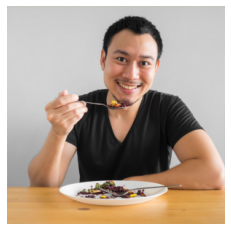

In [ ]:
img = obtain_image(url="https://thecenterformindfuleating.org/resources/Pictures/asian%20man%20eating.jpg")
show_img(img)

a man with a fork and a fork on a plate
a man with a beard sitting on a table with a plate of food .
a man holding a piece of food on a table .
a man is sitting at a table with a plate of food .
a man holding a plate of food and a drink .
a man holding a piece of cake on a plate .
a man with a beard sitting on a table
a man holding a pair of scissors in his hand .
a man with a beard sitting on a table with a plate of food .
a man with a beard sitting on a table with a plate of food .


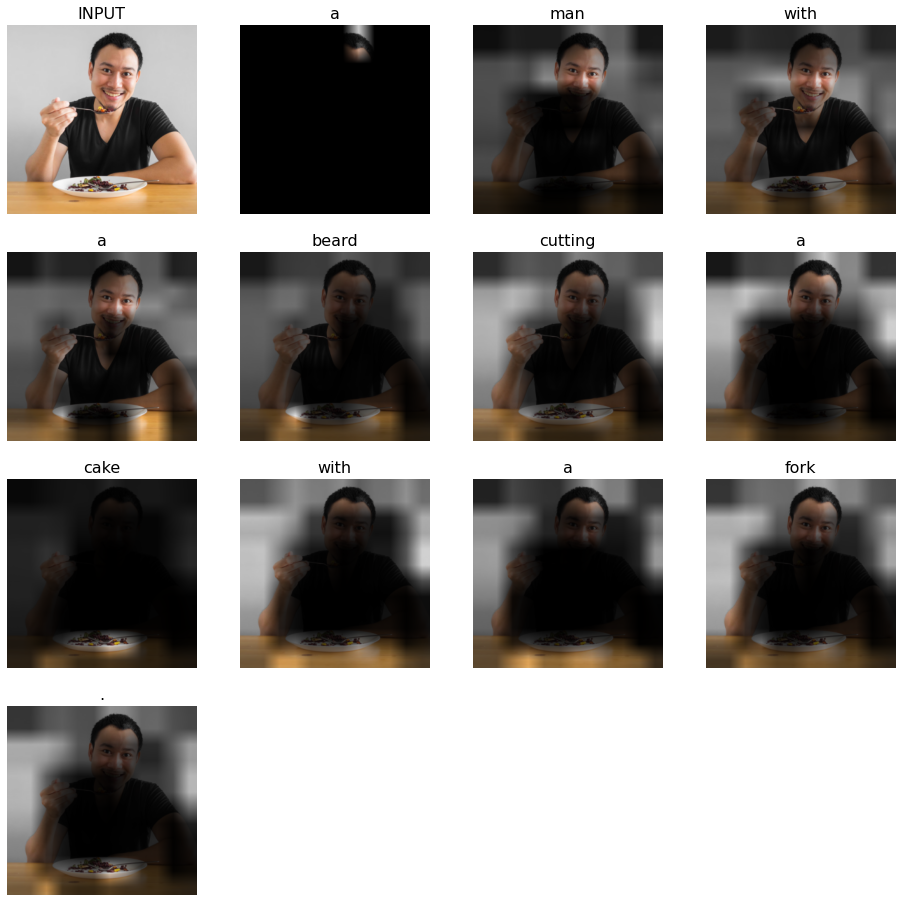

In [ ]:
process_image(img)

a man riding a bike down a road .
a man riding a bike down a road .
a man riding a bike down a road .
a man riding a bike down a road .
a man riding a bike down a road .
a man riding a bike down a road .
a man riding a bike down a road .
a man riding a bike down a road .
a man riding a bike down a road .
a man riding a bike down a road with a man in the background .


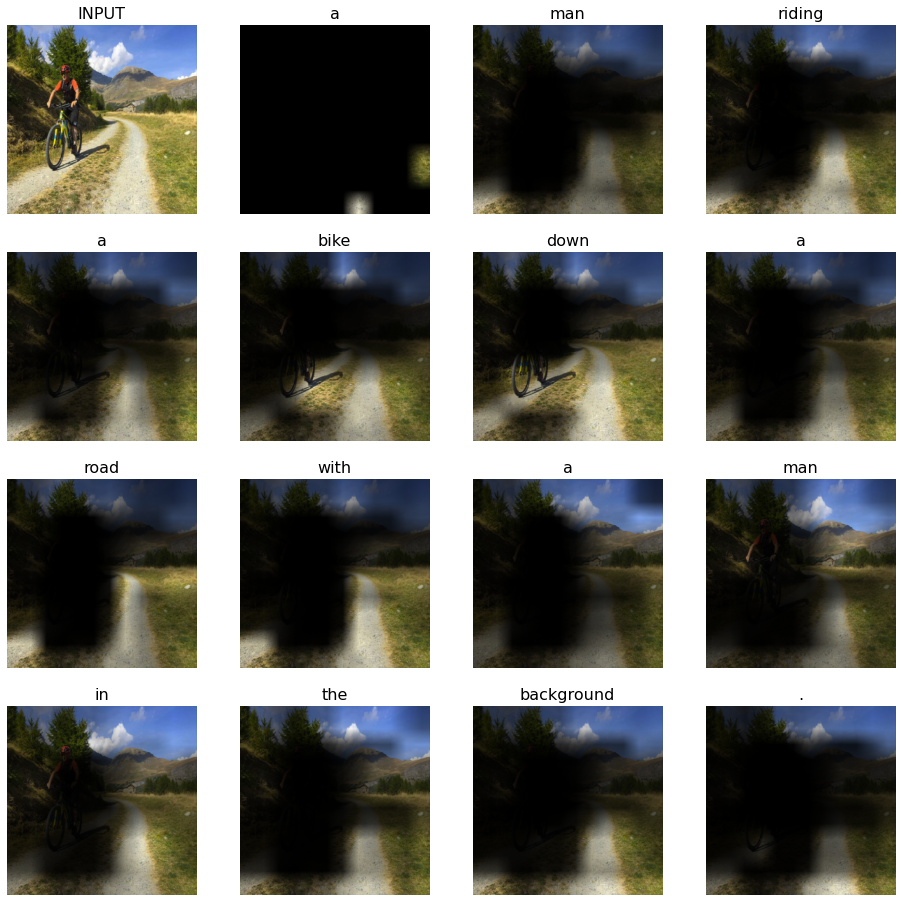

In [ ]:
process_image(obtain_image(url="https://www.dimensioneattiva.it/wp-content/uploads/2016/10/Bike5.jpg"))

a cat laying on a bed with a cat on its head .
a cat is laying on a chair with a cat on the floor .
a cat sitting on a chair with a cat in the background .
a cat sitting on a chair looking at a cat .
a cat sitting on a chair with a cat on its back .
a cat sitting on a chair with a cat on the ground .
a cat sitting on a chair with a cat .
a cat sitting on a chair with a cat on the side .
a cat sitting on a chair with a cat .
a cat sitting on a chair in front of a mirror


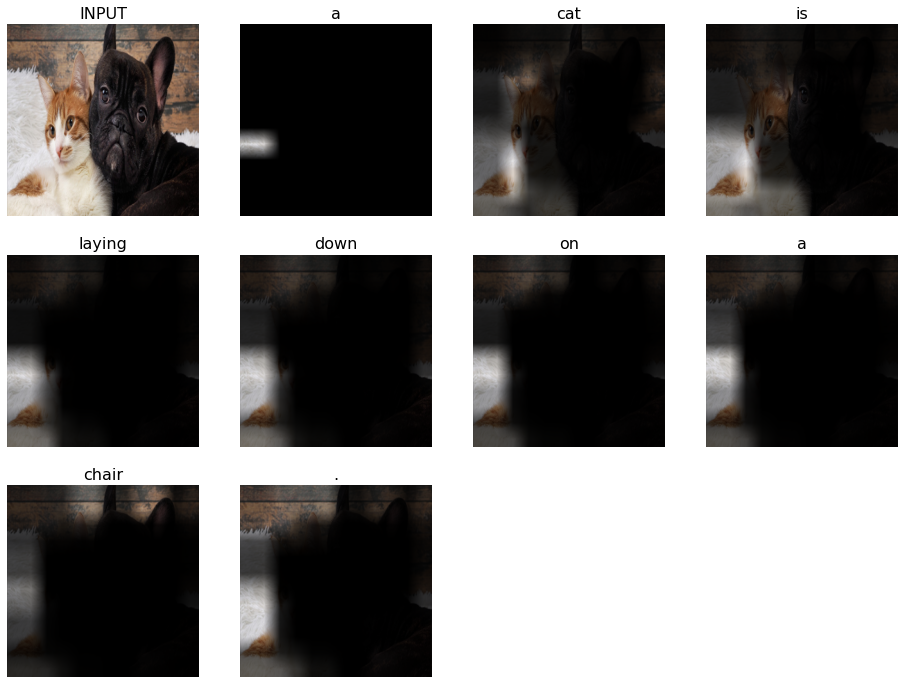

In [ ]:
process_image(obtain_image(url="http://ccanimalclinic.com/wp-content/uploads/2017/07/Cat-and-dog-1.jpg"))

a man doing a trick on a skateboard .
a man doing a trick on a skateboard at a skate park .
a man doing a trick on a skateboard .
a man doing a trick on a skateboard at a skate park .
a man riding a skateboard on a ramp .
a man doing a trick on a skateboard on a ramp .
a man doing a trick on a skateboard at a skate park .
a man doing a trick on a skateboard .
a man doing a trick on a skateboard .
a man doing a trick on a skateboard .


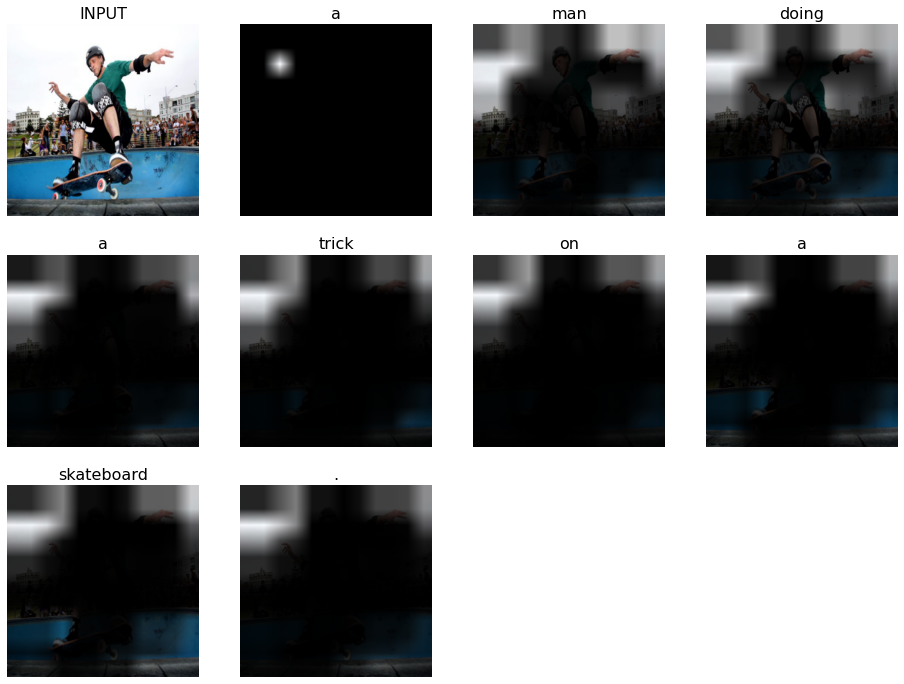

In [ ]:
process_image(obtain_image(url="https://pixel.nymag.com/imgs/daily/selectall/2018/02/12/12-tony-hawk.w710.h473.jpg"))

# Demo
### Find at least 10 images to test it on.
* Seriously, that's part of an assignment. Go get at least 10 pictures to get captioned
* Make sure it works okay on __simple__ images before going to something more comples
* Photos, not animation/3d/drawings, unless you want to train CNN network on anime
* Mind the aspect ratio

a table with many different types of cakes .
a birthday cake with a candle and candles .
a bunch of donuts are sitting on a wood table .
a cake with a bunch of sprinkles on it
a birthday cake with a teddy bear on it
a table with a bunch of doughnuts on it
a table with a bunch of teddy bears and a flask
a bunch of teddy bears are sitting on a table .
a cake with a bunch of sprinkles on it
a birthday cake with a chocolate frosting and sprinkles .


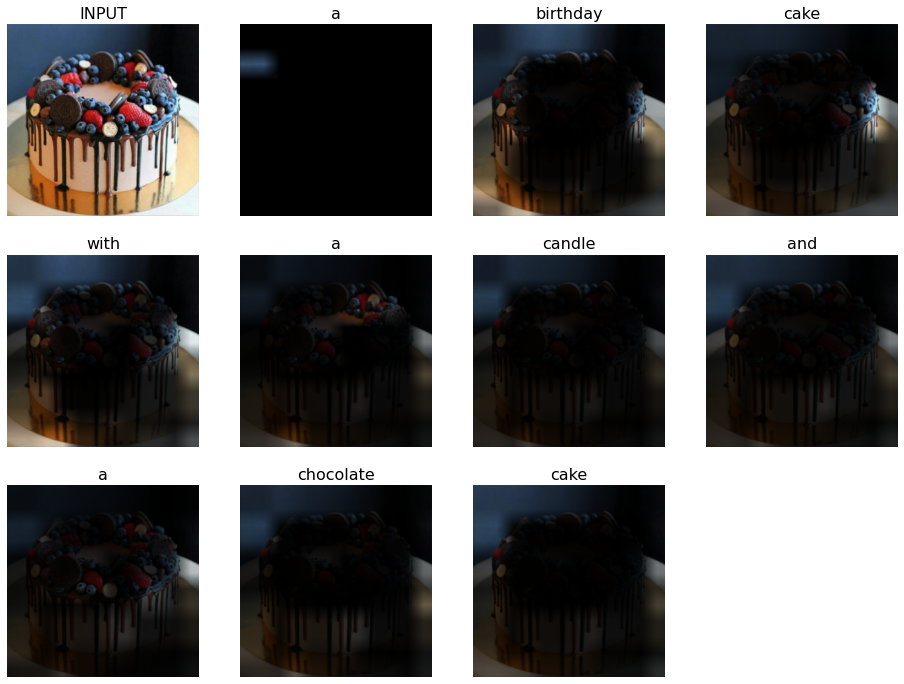

In [ ]:
process_image(obtain_image(filename="./images/pancake.jpg"))

a train traveling down tracks next to a bridge .
a train traveling down train tracks next to a river .
a train going down a track near a bridge .
a train traveling down a bridge over a river .
a train traveling down a bridge over a bridge .
a train traveling down a bridge over a river .
a train on a steel track near a bridge .
a train traveling down the tracks in a city .
a train traveling down a bridge over a city .
a train traveling down a bridge over a river .


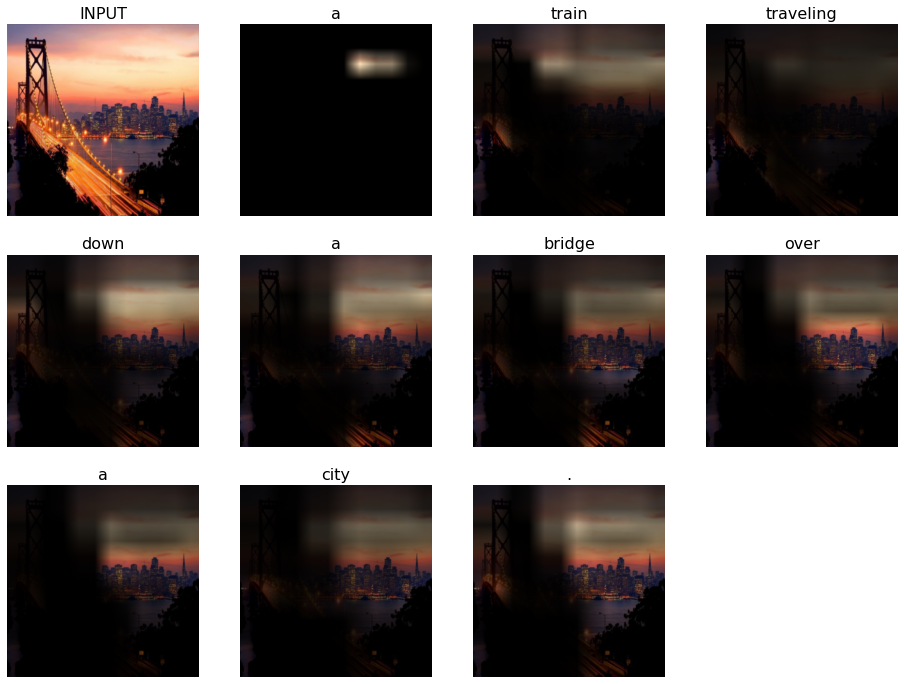

In [ ]:
process_image(obtain_image(filename="./images/bridge.jpg"))

a yellow and yellow vehicle is parked on the street .
a man sitting on a bench in front of a car .
a car parked on the side of a road near a street sign .
a man on a motorcycle with a dog on his back .
a car parked on the side of a road with a car on the side .
a car parked on the side of a road near a city .
a car parked on the side of a road with a car on the side .
a small yellow and white motorcycle parked on the side of a road .
a yellow and white car parked on the side of a road .
a yellow and black motorcycle parked in front of a car .


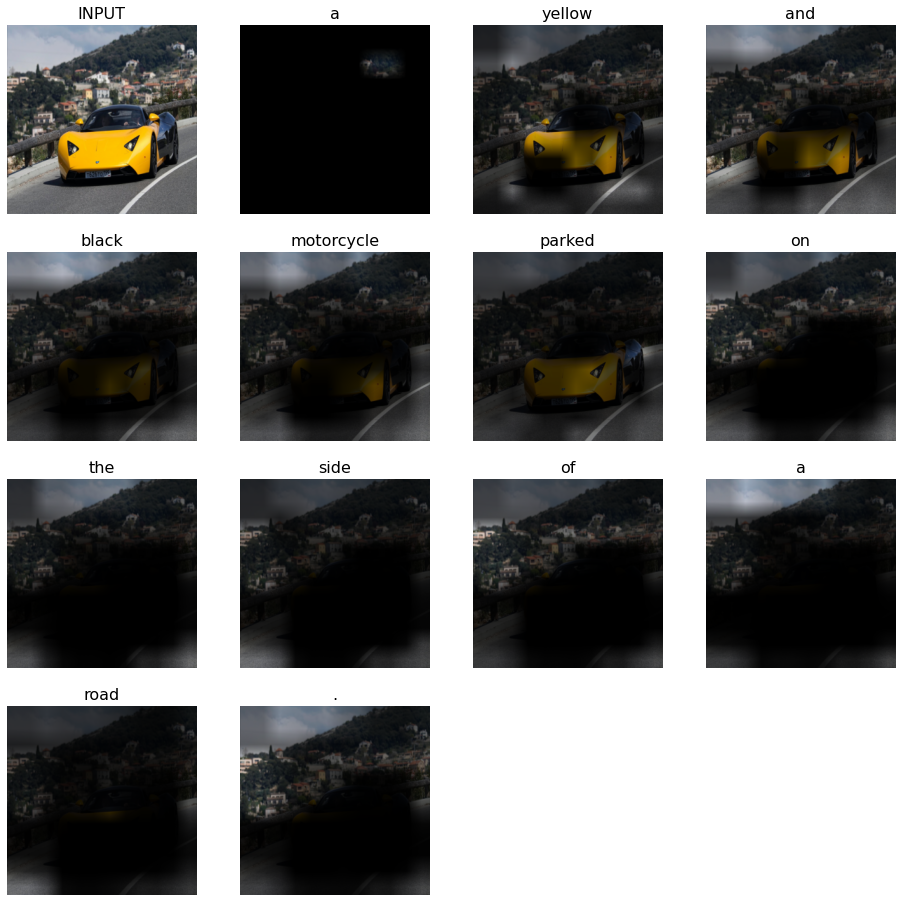

In [ ]:
process_image(obtain_image(filename="./images/car.jpg"))

a woman standing next to a woman holding a cell phone .
a woman is holding a frisbee in her hand .
a woman is standing in front of a tree .
a woman holding a cell phone in her hand .
a woman holding a cell phone in her hand .
a woman in a red dress holding a nintendo wii controller .
a woman holding a cell phone in her hand .
a woman holding a cell phone to her ear .
a woman holding a tennis racquet on a tennis court .
a woman is holding a cell phone to her ear .


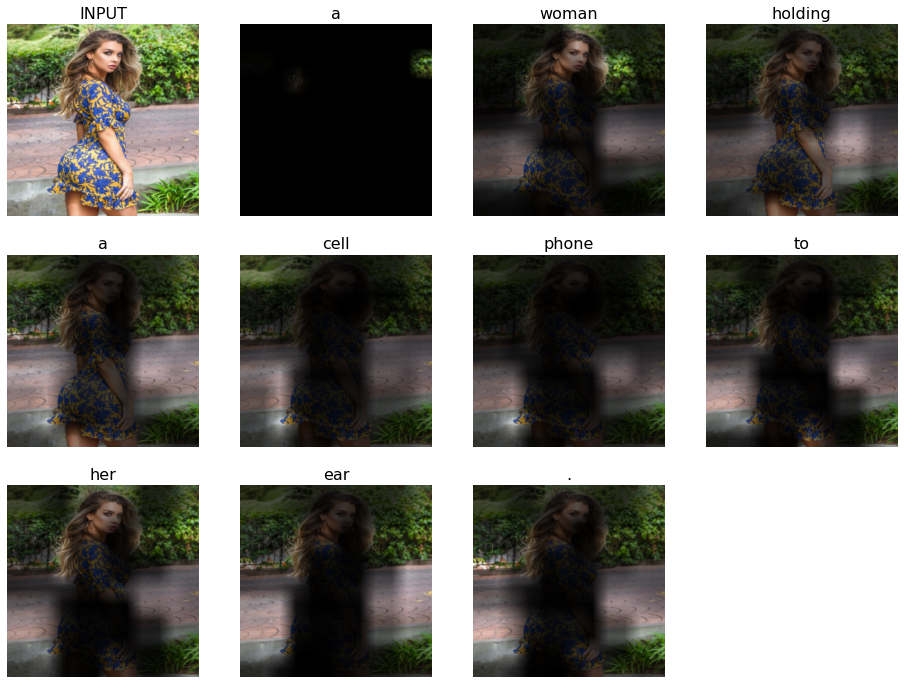

In [ ]:
process_image(obtain_image(filename="./images/girl.jpg"))

a couple of dogs standing on a lush green field .
a black and white dog standing on a grass covered field .
a dog is standing on a grass field .
a dog standing on a lush green field .
a dog and a dog are walking in the grass .
a dog walking across a lush green field .
a dog is running in the grass .
a dog is running in the grass .
a couple of dogs standing on a lush green field .
a black and white dog is standing on a grass covered field .


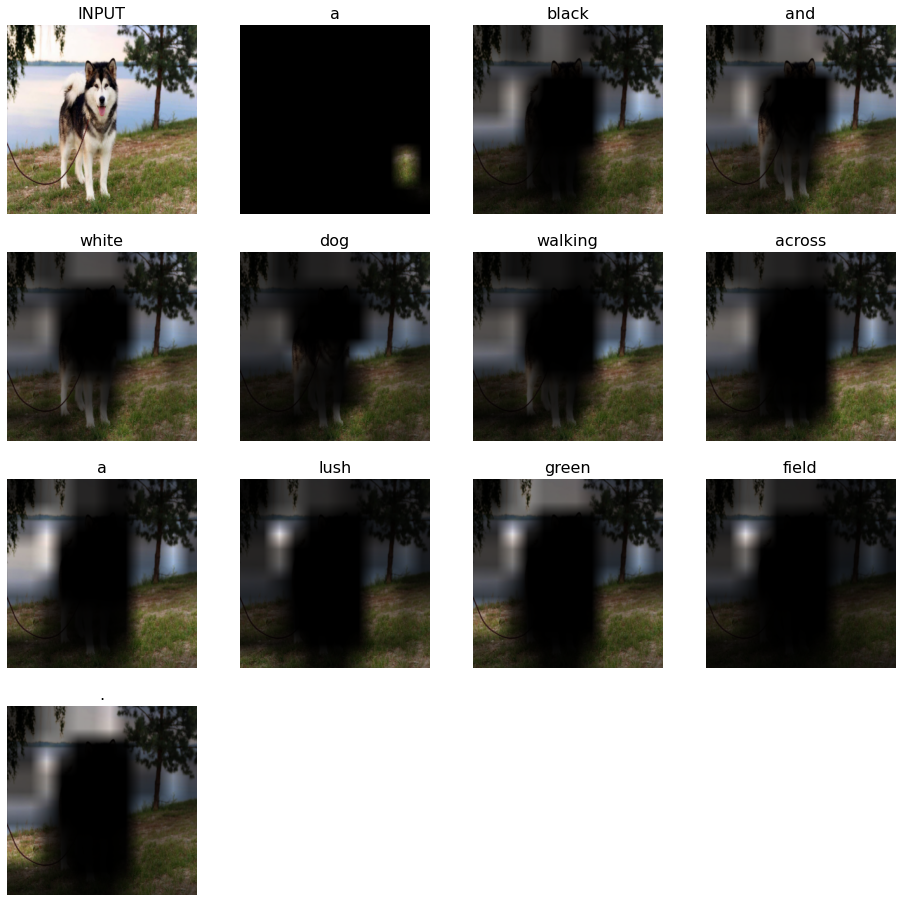

In [ ]:
process_image(obtain_image(filename="./images/dogs.jpg"))

a teddy bear and a teddy bear on a blanket .
a teddy bear and a teddy bear on a red and white teddy bear .
a teddy bear and a stuffed bear on a red and white teddy bear .
a teddy bear and a teddy bear on a christmas tree
a teddy bear sitting on a teddy bear on a tree .
a teddy bear sitting on a teddy bear .
a teddy bear and a teddy bear on a red and white teddy bear .
a teddy bear sitting on a teddy bear on a tree .
a teddy bear with a santa claus hat on its head .
a teddy bear and a stuffed bear sitting on a tree .


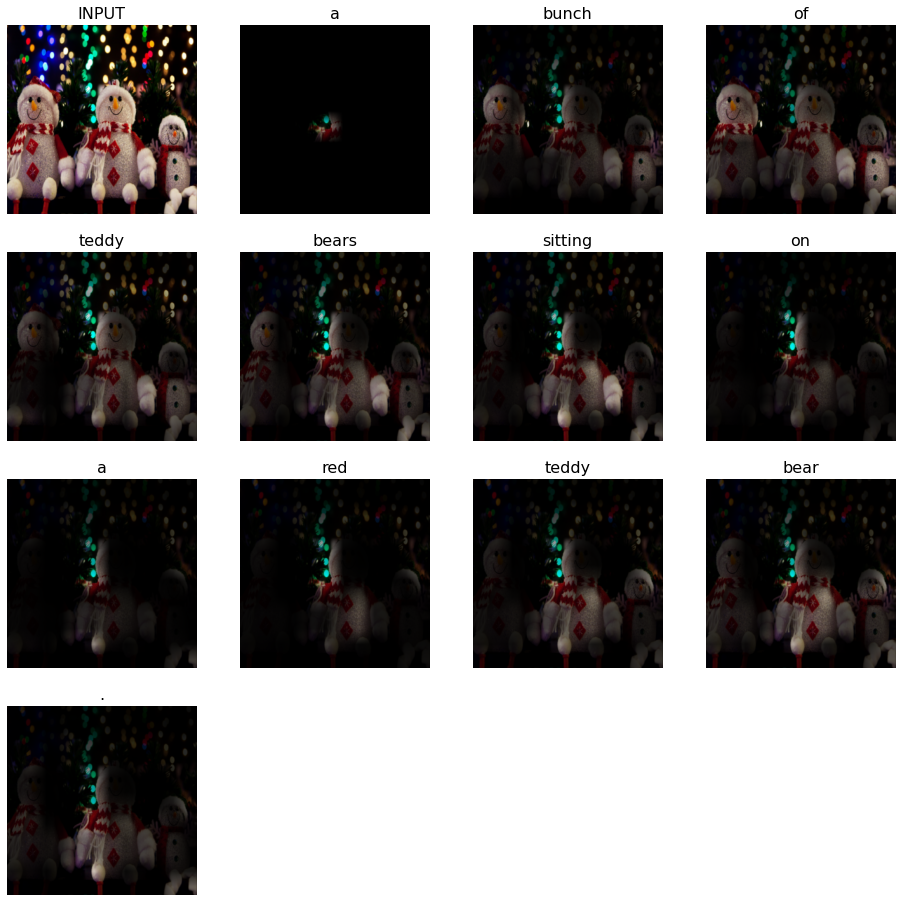

In [ ]:
process_image(obtain_image(filename="./images/snowmen.jpg"))

a group of people on a surfboard in the ocean .
a group of birds are standing in the water .
a group of people in the ocean with a surfboard .
a group of birds are standing on a rock .
a group of birds flying over a body of water .
a group of people in the ocean with a surfboard .
a group of people are standing on a rocky shore .
a group of people are standing on a rocky shore .
a group of birds are sitting on a rock .
a group of people in the ocean with a surfboard .


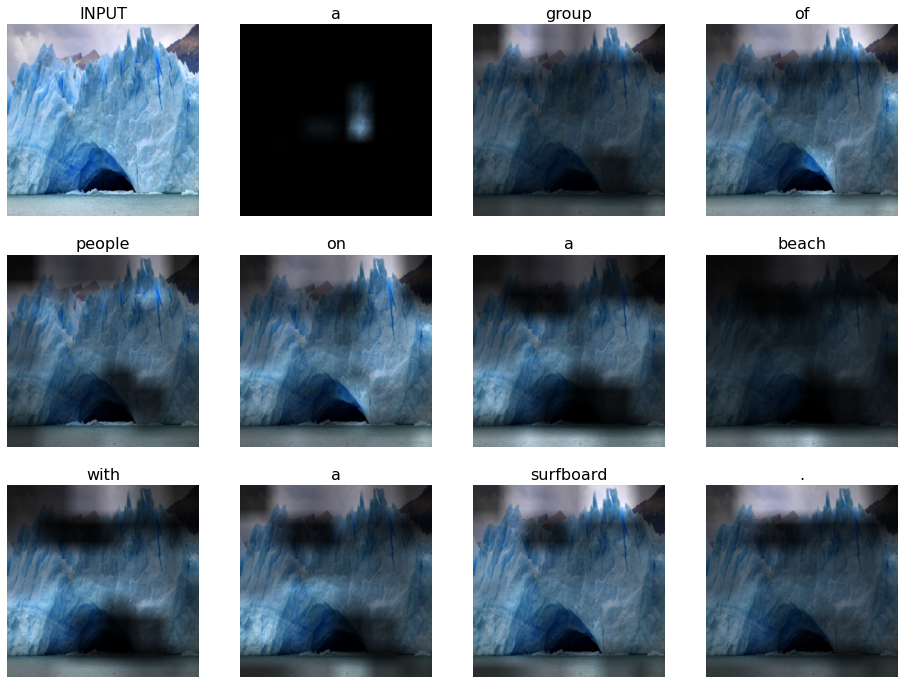

In [ ]:
process_image(obtain_image(filename="./images/glacier.jpg"))

a man riding a motorcycle with a man in the background .
a man riding a motorcycle on a dirt road .
a man riding a motorcycle with a flag .
a man is riding a motorcycle down a dirt road .
a man is riding a motorcycle with a dog .
a man riding a motorcycle down a dirt road .
a man is riding a motorcycle with a dog
a man riding a motorcycle with a dog
a man is riding a motorcycle with a man on it .
a man riding a motorcycle with a red and white car .


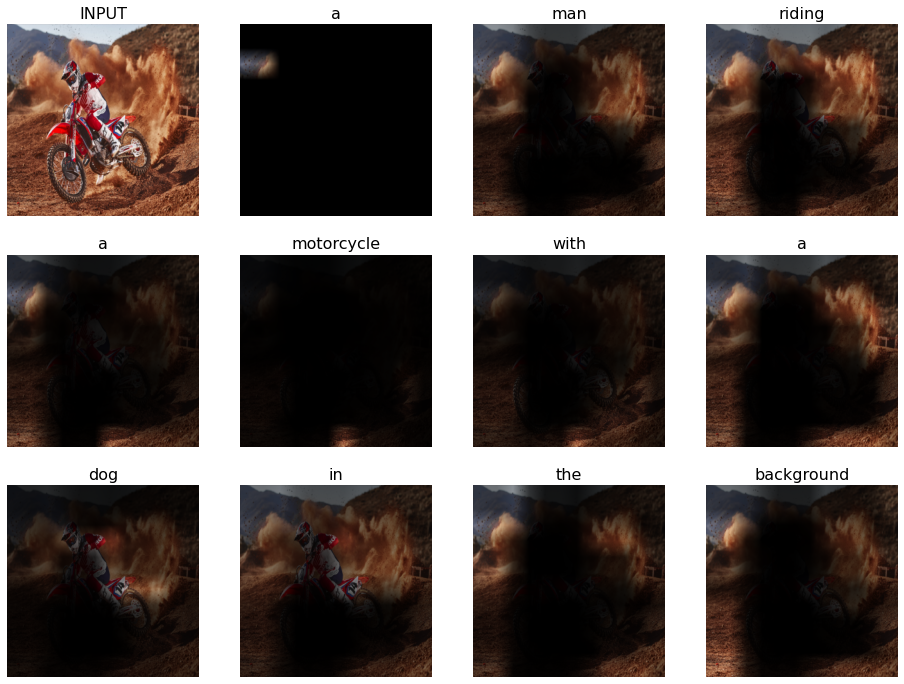

In [ ]:
process_image(obtain_image(filename="./images/motocross.jpg"))

a lake with a large boat in the background .
a lake with a white boat on the shore
a large body of water with a boat in the background .
a boat is on the shore of a lake .
a group of people sitting on a surfboard in the ocean .
a large white boat is on a lake .
a river with a boat in the background
a lake with people sitting on a surfboard in the ocean .
a boat is on the shore of a river .
a boat is on a lake with people on it .


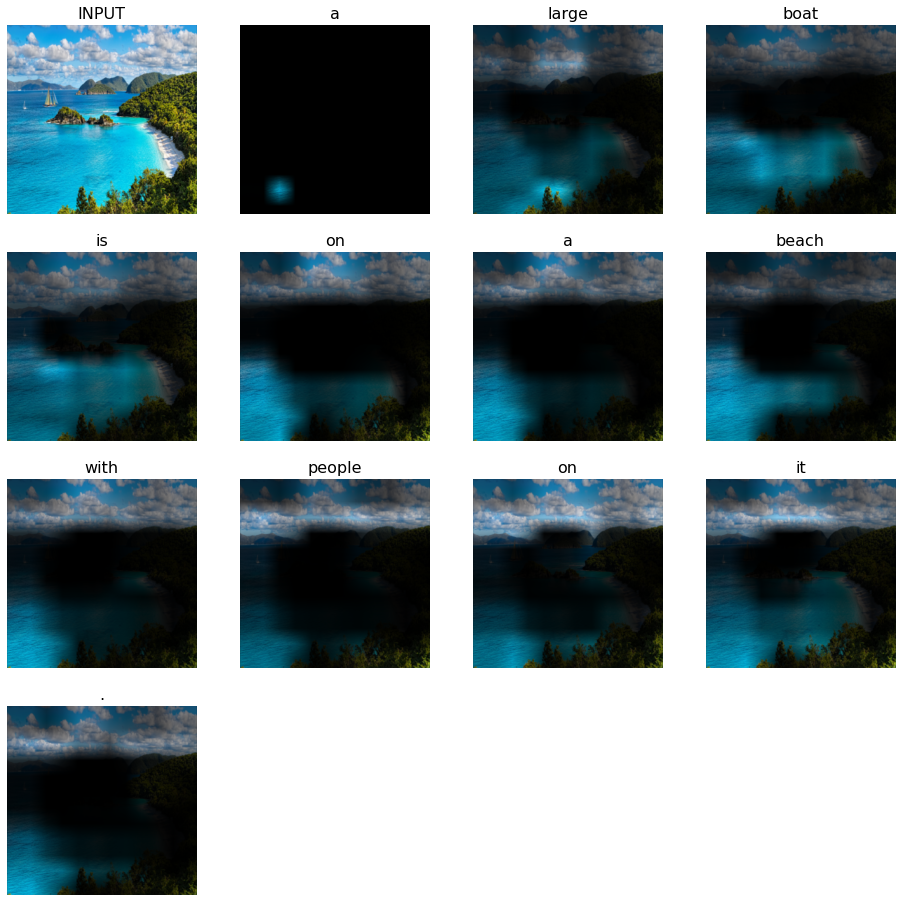

In [ ]:
process_image(obtain_image(filename="./images/beach.jpg"))

a white and black cat sitting on a wooden table .
a cat laying on a wooden table next to a window .
a white bird sitting on a wooden table .
a cat is sitting on a window sill .
a cat is sitting on a wooden table .
a bird is sitting on a wooden table .
a white and black cat is sitting on a wooden table .
a cat is sitting on a table with a white background
a bird sitting on a wooden table next to a window .
a cat is sitting on a window sill .


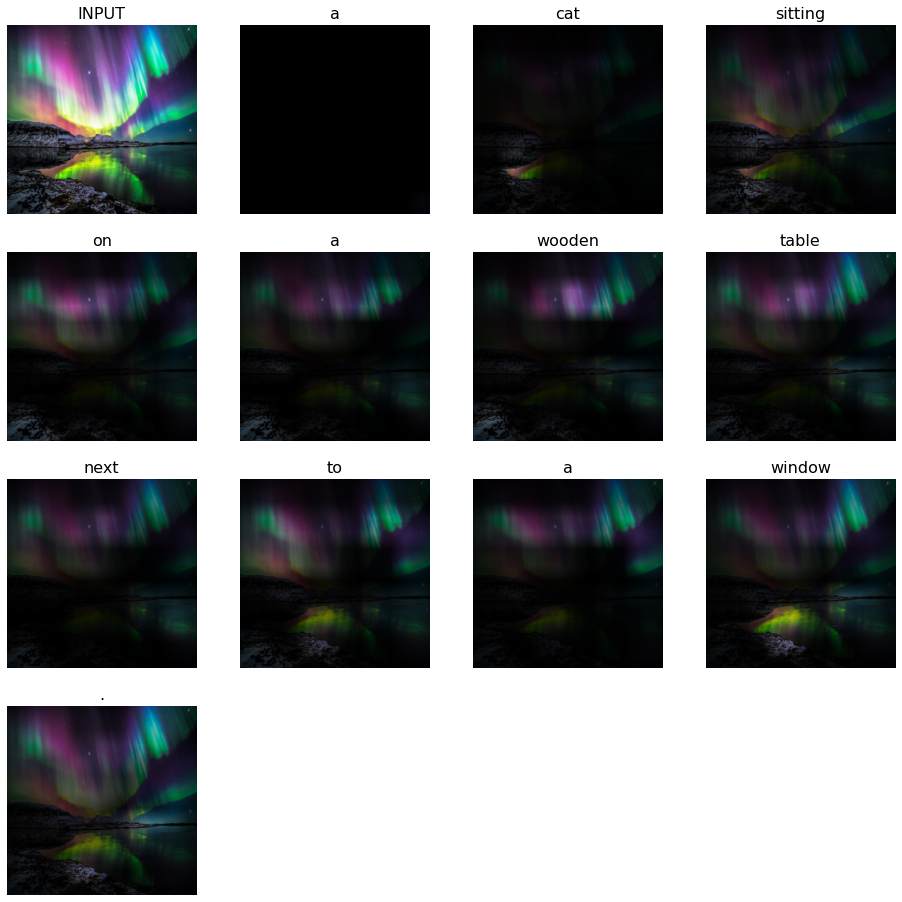

In [ ]:
process_image(obtain_image(filename="./images/polar_lights.jpeg"))

a bear is standing on a rock in the ocean .
a bird is flying over the water with a rocky cliff .
a bear is walking along the beach with a man on it .
a herd of animals that are standing in the sand .
a bear is walking along the beach with a man in the background .
a bird is sitting on the ground in the sand .
a bear is walking along the beach with people in the background .
a herd of animals standing in the sand .
a large elephant standing in the sand with a surfboard .
a large elephant in the ocean with a bird in the background .


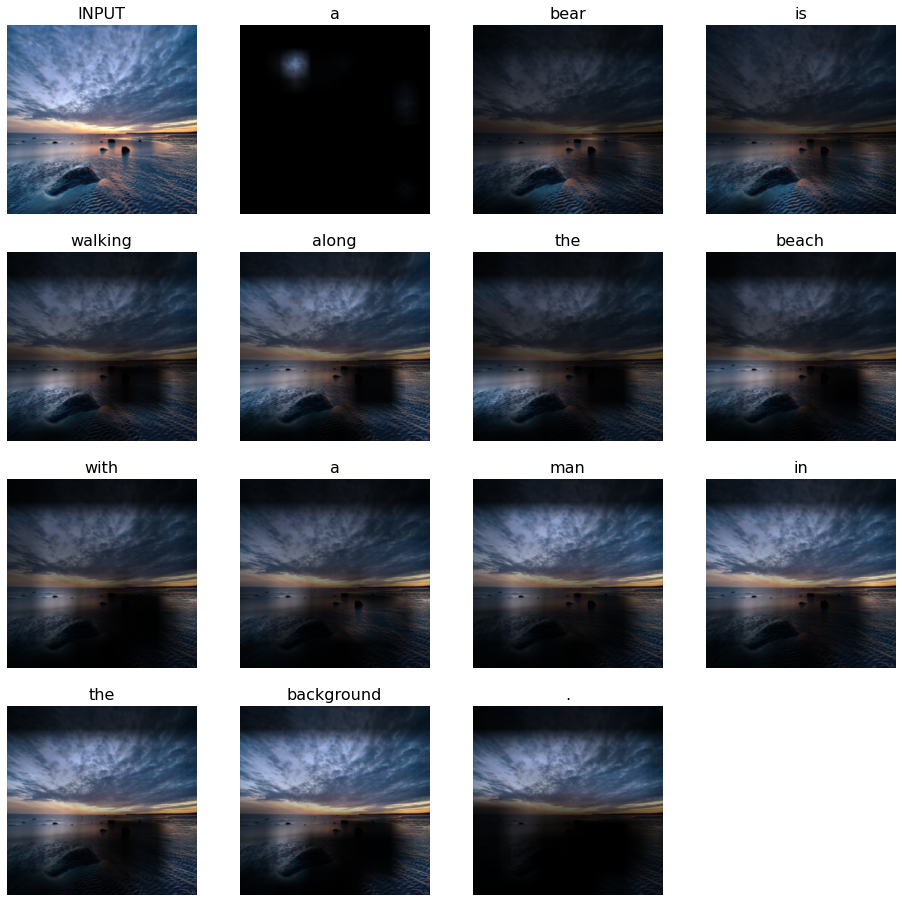

In [ ]:
process_image(obtain_image(filename="./images/sea.jpg"))

a giraffe walking across a lush green field .
a giraffe standing in a field with a sky background
a person is throwing a frisbee on the beach .
a giraffe standing in a field with a sky background
a person walking across a lush green field .
a giraffe standing in a field with a sky background
a giraffe walking across a lush green field .
a giraffe standing in a field with a sky background
a giraffe standing in a field next to a tree .
a giraffe standing in a field with a sky background


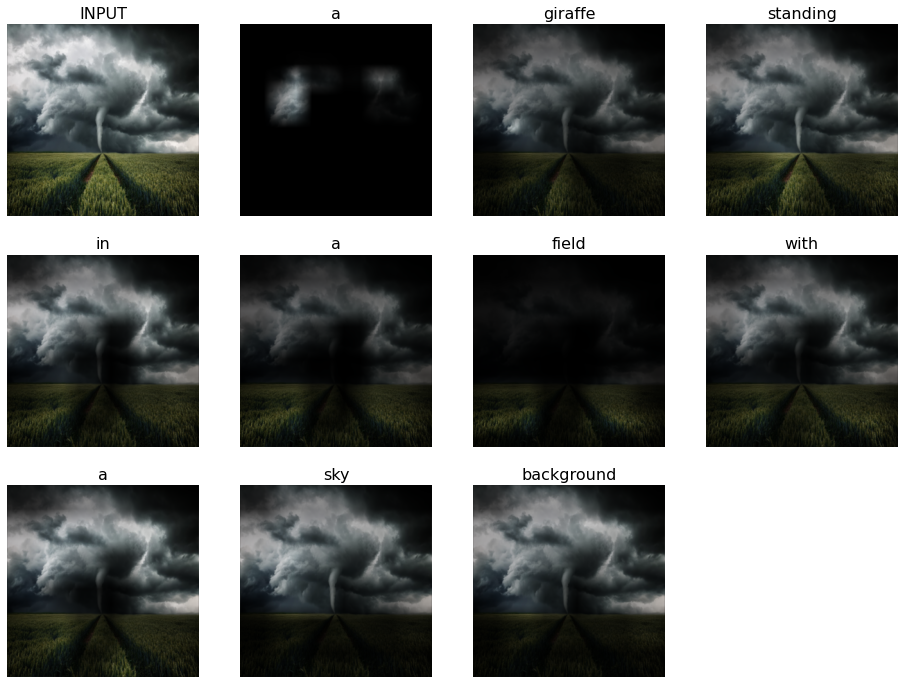

In [ ]:
process_image(obtain_image(filename="./images/tornado.jpg"))

### Conclusion
Here is a place for your conclusions, observations, hypotheses, and any other feedback.

Данная модель неплохо справляется с генерацией заголовков в случае, когда на ней есть какой-то объёкт, выполняющий некоторое действие. Однако она не справляется с пейзажами и явлениями природы, пытаясь найти на них основной объект (будь то медведь/слон на картинке с морем, жираф на картинке с торнадо или кошка на картинке с северным сиянием).  
На то я вижу несколько причин:  
1) inductive bias выборки, которая, по-видимому, состояла из нескольких объектов на ней, и которая не включала в себя пейзажи и другие картинки.  
2) Плохой выбор функции потерь, которая не учитывает того факта, что правильных описаний может быть несколько. Плюс, можно использовать Negative Sampling ввиду большого числа токенов (> 10000)  
3) Малое время обучения сети (1.5 часа)  
4) БОЛЬШЕ ДАННЫХ, БОЛЬШЕ ДАННЫХ

### Now what?

Your model produces some captions but you still strive to improve it? You're damn right to do so. Here are some ideas that go beyond simply "stacking more layers". The options are listed easiest to hardest.

##### Attention
You can build better and more interpretable captioning model with attention over the generated part of the sentense.

##### Subword level captioning
In the base version, we replace all rare words with UNKs which throws away a lot of information and reduces quality. A better way to deal with vocabulary size problem would be to use Byte-Pair Encoding

* BPE implementation you can use: [github_repo](https://github.com/rsennrich/subword-nmt). 
* Theory: https://arxiv.org/abs/1508.07909
* It was originally built for machine translation, but it should work with captioning just as well.

#### Reinforcement learning
* After your model has been pre-trained in a teacher forced way, you can tune for captioning-speific models like CIDEr.
* Tutorial on RL for sequence models: [practical_rl week8](https://github.com/yandexdataschool/Practical_RL/tree/master/week8_scst)
* Theory: https://arxiv.org/abs/1612.00563